In [3]:
# Import Plot.ly functions for both online/offline
import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.tools as tls
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

# Import extra modules as needed
import numpy as np

from dataChest import dataChest

init_notebook_mode()

from probeStationAnalysis import probeTest

## Ox3 ##

Mean R:   {0.0364: 15267.1656, 0.0546: 11102.18832, 0.0182: 24620.35264, 0.0126: 28263.7812}
Mean J_c:   {0.0364: 53.704871033215404, 0.0546: 49.2348076468071, 0.0182: 66.60515156542799, 0.0126: 83.80552874173077}
Theory:  {0.0364: 12183.078151422624, 0.0546: 8122.052100948417, 0.0182: 24366.156302845247, 0.0126: 35195.55910410981}
m = 0.00131496651436  b = 1.82642476134e-05  R_sub = 54751.7763211


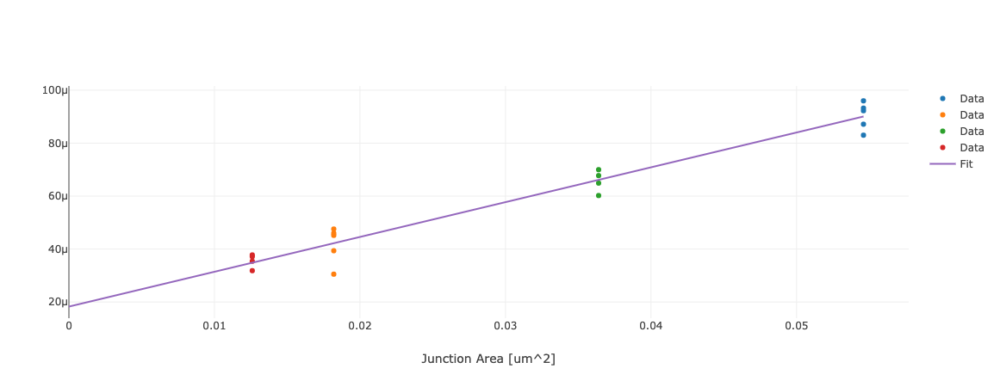

/Users/chriswilen/py-env/mcdermott/lib/python2.7/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning:

Mean of empty slice.

/Users/chriswilen/py-env/mcdermott/lib/python2.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning:

invalid value encountered in double_scalars



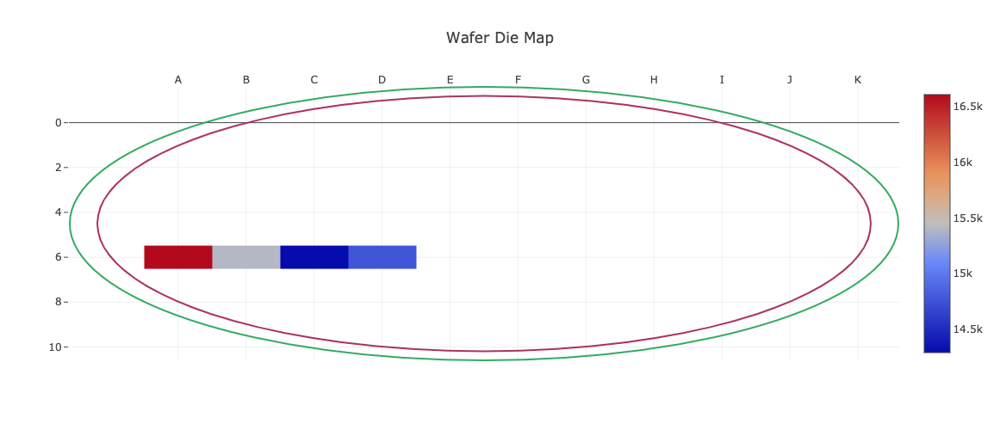

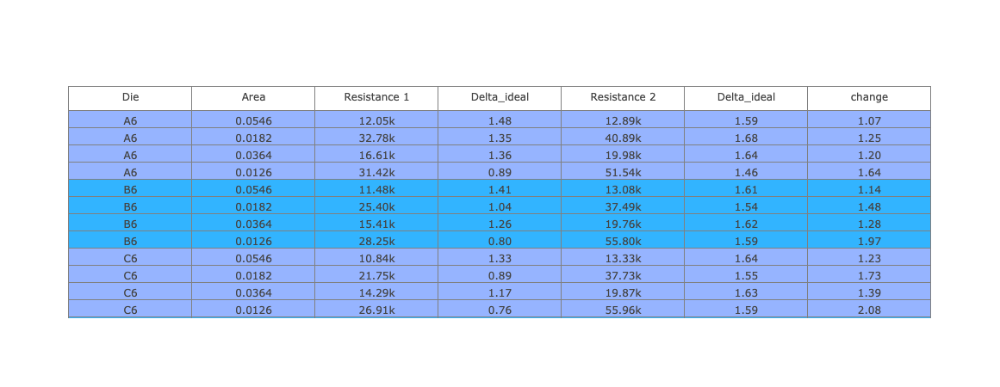

In [4]:
test = probeTest(['fluxNoise_probe_station','cfv2052kai_CW20181211C-Ox3.hdf5'], bounds={})#728:(-1,1)})

test.removeOverwrittenData()
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0232bcr_CW20181211C-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
#test.resistanceHistogram()
#test.displayDataTable()
test.dieMap(0.0364)

# compare with after ozone treatment
chest = dataChest(['fluxNoise_probe_station'])
chest.openDataset('cfx0235quy_CW20181211C-Ox3-afterOzone.hdf5')

dataOrder = ('die', 'index', 'area', 'range', 'resistance')
later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
for row in test.data:
    row['later_resistance'] = np.nan
    for line in later_data:
        if row['die']==line['die'] and row['index']==line['index']:
            row['later_resistance'] = line['resistance']
colors = ['rgb({},180,255)'.format( 50+100*(ord(row['die'][0])%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Die', 'Area', 'Resistance 1', 'Delta_ideal', 'Resistance 2', 'Delta_ideal', 'change']),
    cells=dict(values=[[row['die'] for row in test.data],
                       [row['area'] for row in test.data],
                       ['{:.2f}k'.format(row['resistance']/1000) for row in test.data],
                       ['{:.2f}'.format(row['resistance']/theoryR[row['area']]) for row in test.data],
                       ['{:.2f}k'.format(row['later_resistance']/1000) for row in test.data],
                       ['{:.2f}'.format(row['later_resistance']/theoryR[row['area']]) for row in test.data],
                       ['{:.2f}'.format(row['later_resistance']/row['resistance']) for row in test.data]],
                fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=800))
iplot(fig, filename = 'basic_table')

## Ox4 ##

Mean R:   {0.0364: 12251.87344, 0.0546: 8895.467136000001, 0.0182: 19407.41728, 0.0126: 24685.635520000003}
Mean J_c:   {0.0364: 66.92210490143152, 0.0546: 61.44861175212242, 0.0182: 84.49564903576315, 0.0126: 95.95301388078623}
Theory:  {0.0364: 12183.078151422624, 0.0546: 8122.052100948417, 0.0182: 24366.156302845247, 0.0126: 35195.55910410981}
m = 0.00170139140576  b = 1.995044429e-05  R_sub = 50124.1970086


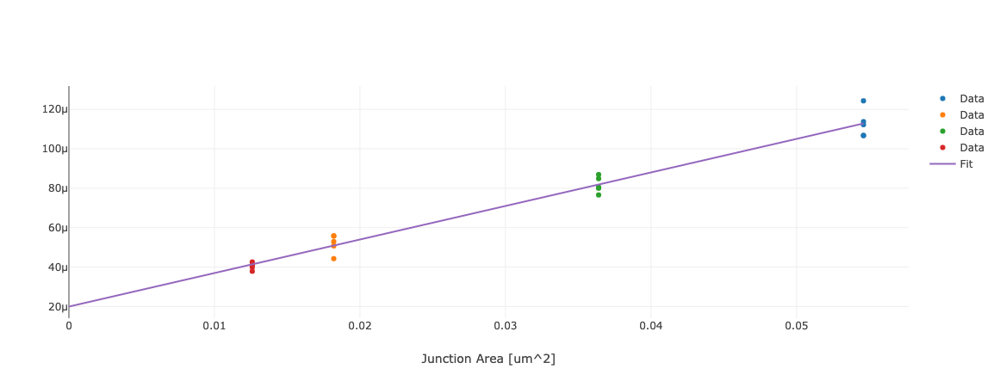

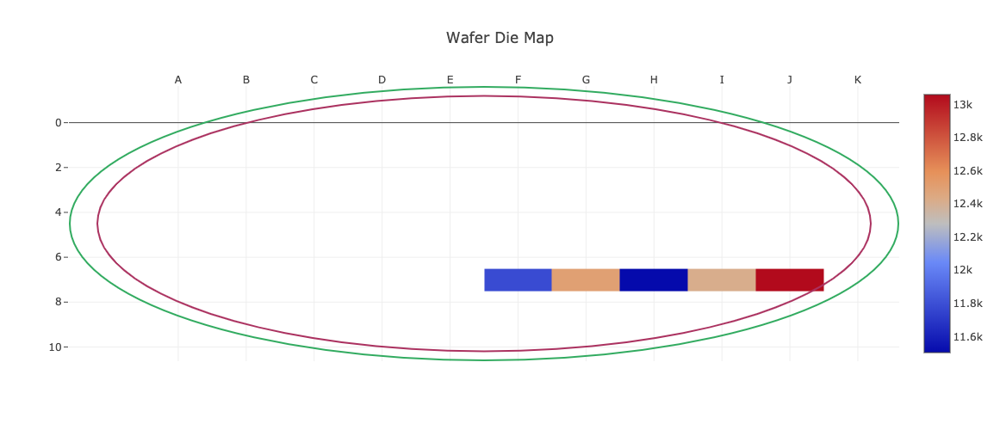

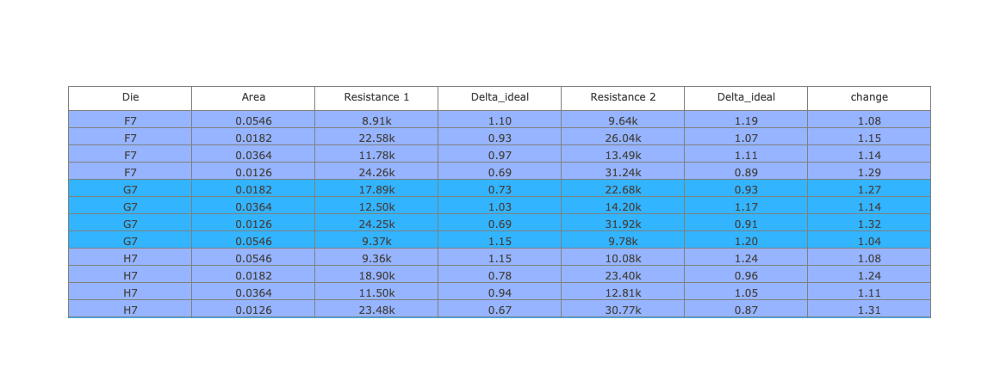

In [5]:
test = probeTest(['fluxNoise_probe_station','cfy2317qyj_CW20181211C-Ox4.hdf5'], bounds={})#728:(-1,1)})

test.removeOverwrittenData()
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
#test.resistanceHistogram()
#test.displayDataTable()
test.dieMap(0.0364)

# compare after several days
chest = dataChest(['fluxNoise_probe_station'])
chest.openDataset('cgb1746hnq_CW20181211C-Ox4-remeasured.hdf5')

dataOrder = ('die', 'index', 'area', 'range', 'resistance')
later_data = [dict(zip(dataOrder,row)) for row in chest.getData()]
for row in test.data:
    row['later_resistance'] = np.nan
    for line in later_data:
        if row['die']==line['die'] and row['index']==line['index']:
            row['later_resistance'] = line['resistance']
colors = ['rgb({},180,255)'.format( 50+100*((ord(row['die'][0])+int(row['die'][1]))%2) ) for row in test.data]
table = go.Table(
    header=dict(values=['Die', 'Area', 'Resistance 1', 'Delta_ideal', 'Resistance 2', 'Delta_ideal', 'change']),
    cells=dict(values=[[row['die'] for row in test.data],
                       [row['area'] for row in test.data],
                       ['{:.2f}k'.format(row['resistance']/1000) for row in test.data],
                       ['{:.2f}'.format(row['resistance']/theoryR[row['area']]) for row in test.data],
                       ['{:.2f}k'.format(row['later_resistance']/1000) for row in test.data],
                       ['{:.2f}'.format(row['later_resistance']/theoryR[row['area']]) for row in test.data],
                       ['{:.2f}'.format(row['later_resistance']/row['resistance']) for row in test.data]],
                fill = dict(color = [colors, colors, colors])
              ))
fig=dict(data=[table], layout=dict(height=800))
iplot(fig, filename = 'basic_table')

## Ox5 #

Mean R:   {0.0364: 43459.145599999996, 0.0546: 44018.620800000004, 0.0182: 39233.3584, 0.0126: 39686.876000000004}
Mean J_c:   {0.0364: 18.86648134174876, 0.0546: 12.41779266273214, 0.0182: 41.79714370772515, 0.0126: 59.68373846574847}
Theory:  {0.0364: 12183.078151422624, 0.0546: 8122.052100948417, 0.0182: 24366.156302845247, 0.0126: 35195.55910410981}
m = -7.07430599173e-05  b = 2.63368713802e-05  R_sub = 37969.5820951


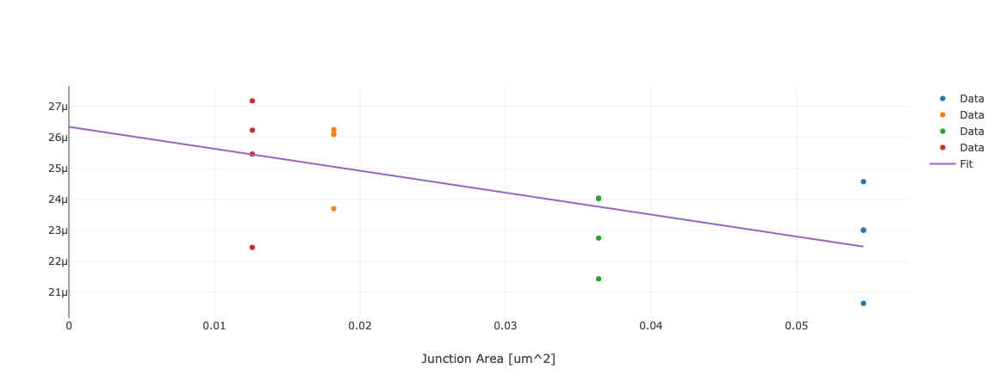

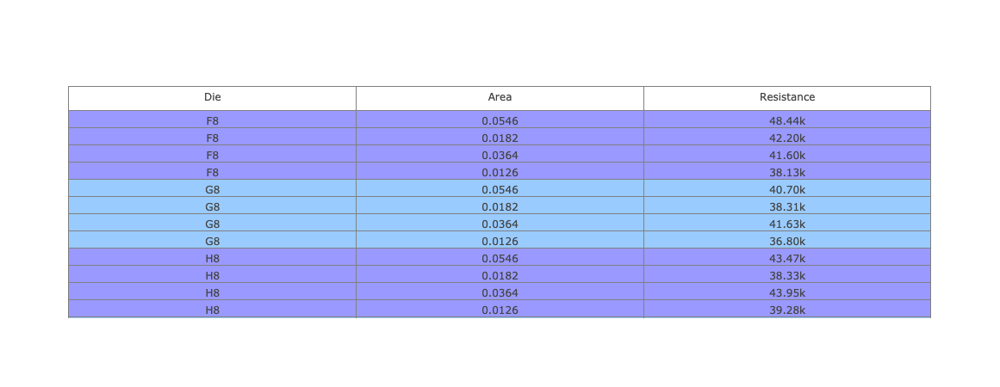

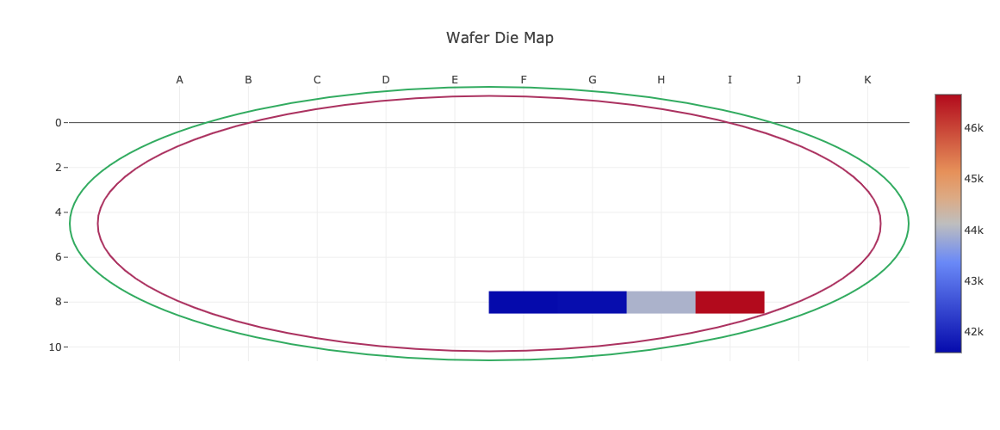

In [3]:
test = probeTest(['fluxNoise_probe_station','cgj1847fhq_CW20181211C-Ox5.hdf5'], bounds={})#728:(-1,1)})

#test.removeOverwrittenData()
for i in range(len(test.data)-1,-1,-1):
    for j in range(i-1,-1,-1):
        if (test.data[i]['die'] == test.data[j]['die']
                and test.data[i]['index'] == test.data[j]['index']):
            del test.data[i]
            break
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
#test.resistanceHistogram()
test.displayDataTable()
test.dieMap(0.0364)

## Ox6 ##
Lamp on:

In [ ]:
test = probeTest(['fluxNoise_probe_station','cgk1744eba_CW20181211C-Ox6.hdf5'], bounds={546:(6000,60000)})#728:(-1,1)})

#test.removeOverwrittenData()
for i in range(len(test.data)-1,-1,-1):
    for j in range(i-1,-1,-1):
        if (test.data[i]['die'] == test.data[j]['die']
                and test.data[i]['index'] == test.data[j]['index']):
            del test.data[i]
            break
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
#test.resistanceHistogram()
test.displayDataTable()
test.dieMap(0.0364)

Lamp off:

Mean R:   {0.0364: 11943.6032, 0.0546: 8324.22656, 0.0182: 19742.2848, 0.0126: 24719.1664}
Mean J_c:   {0.0364: 68.6493971593717, 0.0546: 65.66545281461303, 0.0182: 83.06243860799158, 0.0126: 95.8228562151914}
Theory:  {0.0364: 12183.078151422624, 0.0546: 8122.052100948417, 0.0182: 24366.156302845247, 0.0126: 35195.55910410981}
m = 0.00189158360643  b = 1.61425904935e-05  R_sub = 61947.9259169


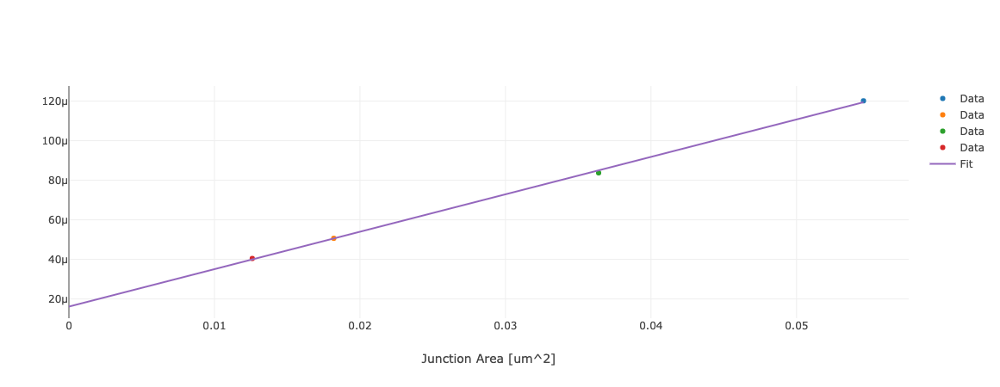

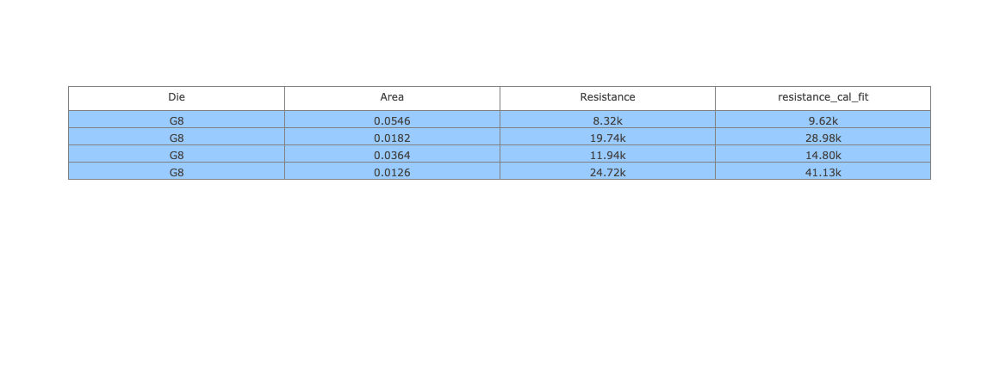

In [5]:
test = probeTest(['fluxNoise_probe_station','chm2316blp_CW20181211C-Ox6-1_afterADR3.hdf5'], bounds={})#728:(-1,1)})
test.addSubstrateCalibrationFromFit()

#test.removeOverwrittenData()
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
test.displayDataTable()

## Ox7 ##
Lamp on:

In [ ]:
test = probeTest(['fluxNoise_probe_station','cjj2237wiq_CW20181211C-Ox7.hdf5'], bounds={})#728:(-1,1)})

#test.removeOverwrittenData()
for i in range(len(test.data)-1,-1,-1):
    for j in range(i-1,-1,-1):
        if (test.data[i]['die'] == test.data[j]['die']
                and test.data[i]['index'] == test.data[j]['index']):
            del test.data[i]
            break
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
test.resistanceHistogram()
test.displayDataTable()
test.dieMap(0.0364)

Lamp off:

In [6]:
test = probeTest(['fluxNoise_probe_station','cjj2237wiq_CW20181211C-Ox7.hdf5'], bounds={})#728:(-1,1)})
test.addSubstrateCalibrationFromFit()

#test.removeOverwrittenData()
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
for row in test.data:
    row['area'] = 0.1*0.001*row['area']
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
test.displayDataTable()

KeyError: 'resistance'